# **What is computer vision?**
Computer vision is a field of artificial intelligence (AI) that uses machine learning and neural networks to teach computers and systems to derive meaningful information from digital images, videos and other visual inputs—and to make recommendations or take actions when they see defects or issues.

##**What is a computer vision problem?**
Computer vision problems refer to the challenges faced in enabling computers to "see" and interpret images and videos in a way that is similar to human vision. These problems encompass a wide range of tasks, including object detection, image classification, scene understanding, and more. Essentially, it's about getting computers to understand and extract meaningful information from visual data

### Example of computer vision problem

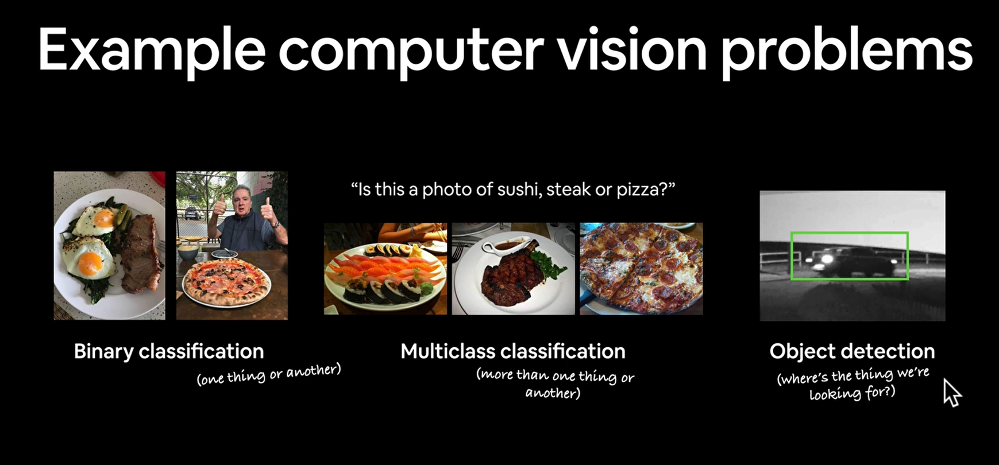

### What are the topic, we're going to cover?

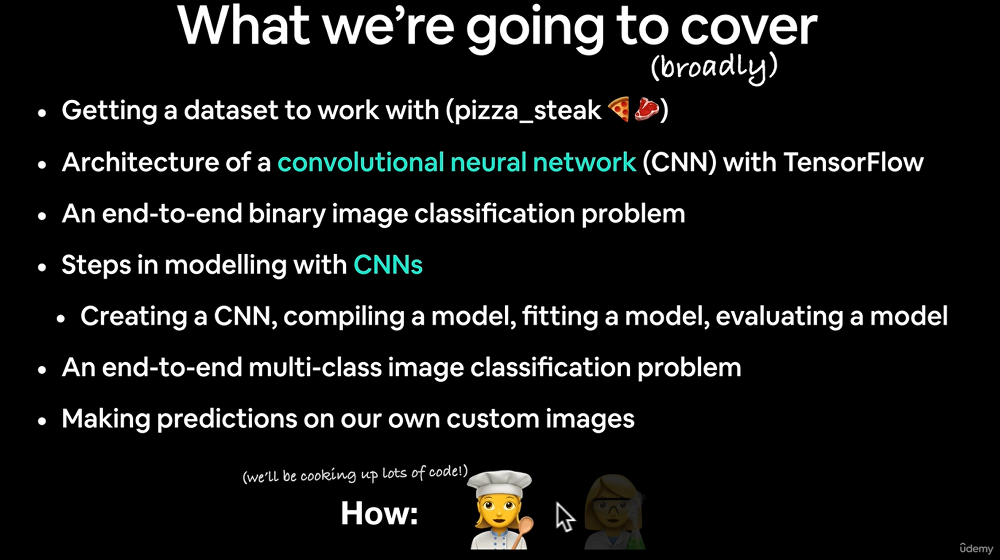

### Input and Output shapes

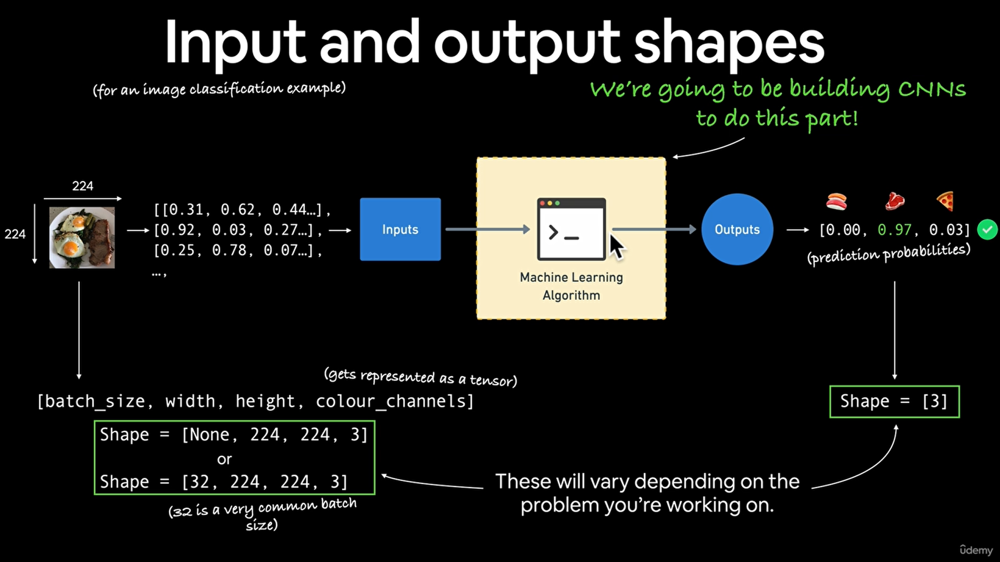

### Architecture of a CNN

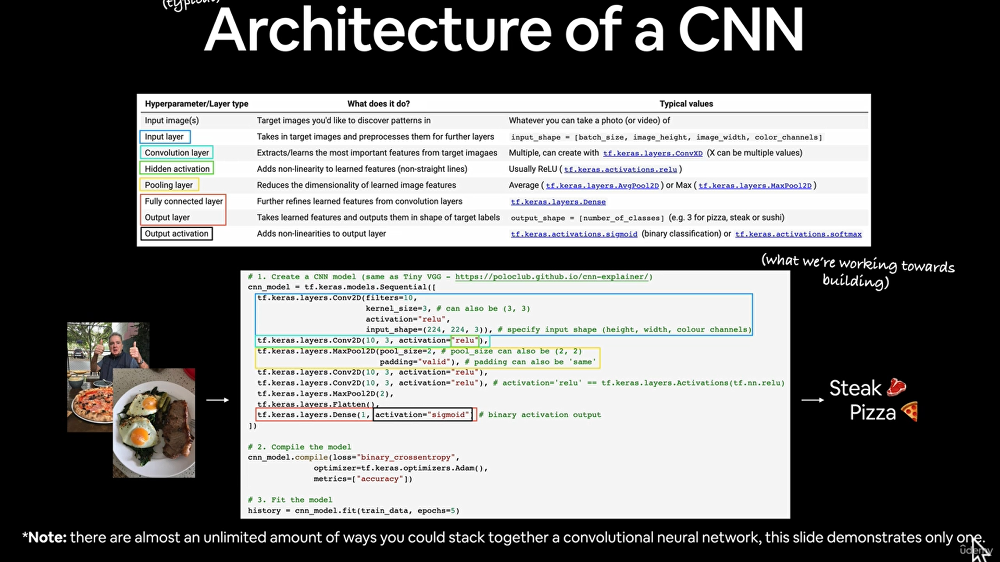

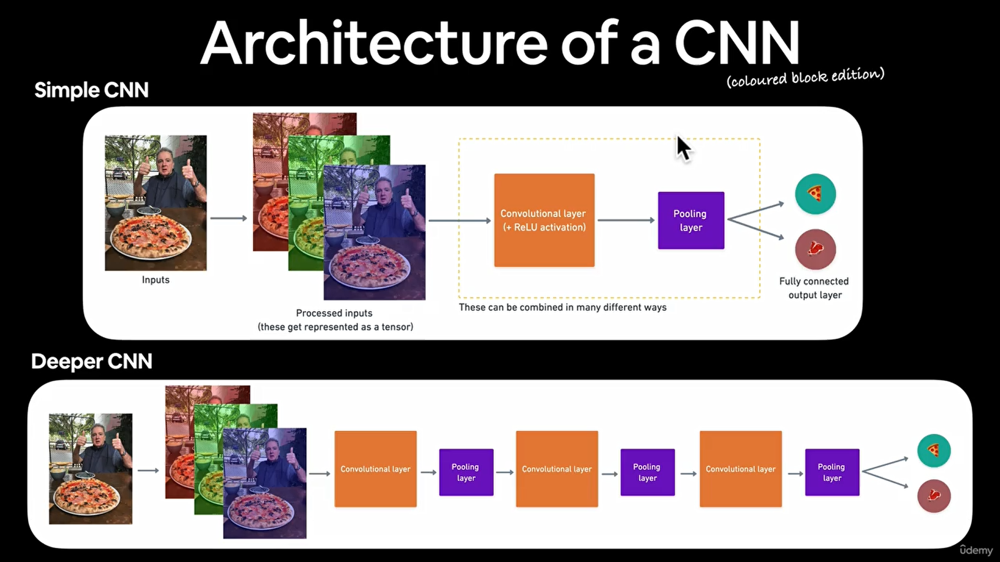

### Get the data

The images we're working with are from the Food101 dataset(101 different classes of food): https://www.kaggle.com/dansbecker/food-101
However we've modified it to only use two classes (pizza 🍕 & steak 🥩) using the image data modification notebook:
https://github.com/mrdbourke/tensorflow-deep-learning/blob/main/extras/image_data_modification.ipynb

> 🔑**Note:** We start with a smaller dataset so we can experiment quickly and figure what works ( or better yet what doesn't work) before scaling up.

In [1]:
import zipfile

!wget https://storage.googleapis.com/ztm_tf_course/food_vision/pizza_steak.zip

# Unzip the download file
zip_ref = zipfile.ZipFile('pizza_steak.zip')
zip_ref.extractall()
zip_ref.close()
"""
Already downloaded, the number of types of u run ,the number of time u will dowload.
"""

--2025-06-24 10:59:22--  https://storage.googleapis.com/ztm_tf_course/food_vision/pizza_steak.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.251.2.207, 142.250.141.207, 74.125.137.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.251.2.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 109540975 (104M) [application/zip]
Saving to: ‘pizza_steak.zip’

pizza_steak.zip     100%[===================>] 104.47M   226MB/s    in 0.5s    

2025-06-24 10:59:23 (226 MB/s) - ‘pizza_steak.zip’ saved [109540975/109540975]



'\nAlready downloaded, the number of types of u run ,the number of time u will dowload.\n'

## Inspect the data (become one with it)

A very crucial step at the beginning of any machine learning project is becoming one with the data.

And for a computer vision project... this usually means visualizing many smaples of your data.

In [2]:
!ls pizza_steak

test  train


In [3]:
!ls pizza_steak/train/

pizza  steak


In [4]:
!ls pizza_steak/train/steak

1000205.jpg  1647351.jpg  2238681.jpg  2824680.jpg  3375959.jpg  417368.jpg
100135.jpg   1650002.jpg  2238802.jpg  2825100.jpg  3381560.jpg  4176.jpg
101312.jpg   165639.jpg   2254705.jpg  2826987.jpg  3382936.jpg  42125.jpg
1021458.jpg  1658186.jpg  225990.jpg   2832499.jpg  3386119.jpg  421476.jpg
1032846.jpg  1658443.jpg  2260231.jpg  2832960.jpg  3388717.jpg  421561.jpg
10380.jpg    165964.jpg   2268692.jpg  285045.jpg   3389138.jpg  438871.jpg
1049459.jpg  167069.jpg   2271133.jpg  285147.jpg   3393547.jpg  43924.jpg
1053665.jpg  1675632.jpg  227576.jpg   2855315.jpg  3393688.jpg  440188.jpg
1068516.jpg  1678108.jpg  2283057.jpg  2856066.jpg  3396589.jpg  442757.jpg
1068975.jpg  168006.jpg   2286639.jpg  2859933.jpg  339891.jpg	 443210.jpg
1081258.jpg  1682496.jpg  2287136.jpg  286219.jpg   3417789.jpg  444064.jpg
1090122.jpg  1684438.jpg  2291292.jpg  2862562.jpg  3425047.jpg  444709.jpg
1093966.jpg  168775.jpg   229323.jpg   2865730.jpg  3434983.jpg  447557.jpg
1098844.jpg  1697

In [5]:
import os

# Walk through pizza_steak directory and list of files
for dirpath, dirnames, filenames in os.walk('pizza_steak'):
  print(f'There are {len(dirnames)} directories and {len(filenames)} in "{dirpath}".')

There are 2 directories and 0 in "pizza_steak".
There are 2 directories and 0 in "pizza_steak/test".
There are 0 directories and 250 in "pizza_steak/test/steak".
There are 0 directories and 250 in "pizza_steak/test/pizza".
There are 2 directories and 0 in "pizza_steak/train".
There are 0 directories and 750 in "pizza_steak/train/steak".
There are 0 directories and 750 in "pizza_steak/train/pizza".


In [6]:
!ls -la pizza_steak

total 16
drwxr-xr-x 4 root root 4096 Jun 24 10:59 .
drwxr-xr-x 1 root root 4096 Jun 24 10:59 ..
drwxr-xr-x 4 root root 4096 Jun 24 10:59 test
drwxr-xr-x 4 root root 4096 Jun 24 10:59 train


In [7]:
# Anther way to find out how many images are in a file
num_steak_images_train = len(os.listdir("pizza_steak/train/steak"))
num_steak_images_train

750

# Get the classnames programmatically

In [8]:
# Get the classnames programmatically
import pathlib
import numpy as np
data_dir = pathlib.Path("pizza_steak/train")
class_names = np.array(sorted([item.name for item in data_dir.glob("*")]))
print(class_names)

['pizza' 'steak']


In [9]:
# Let's visualize our images
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

def view_random_image(target_dir, target_class):
  # Setup the target directory (we'll view images from here)
  target_folder = target_dir + target_class

  # Get a random image path
  random_image = random.sample(os.listdir(target_folder), 1)
  print(random_image)

  # Read in the image and plot it using matplotlib
  img = mpimg.imread(target_folder + "/" + random_image[0])
  plt.imshow(img)
  plt.title(target_class)
  plt.axis("off");

  print(f'Image shape: {img.shape}') # show the shape of the image
  return img

['184226.jpg']
Image shape: (512, 506, 3)


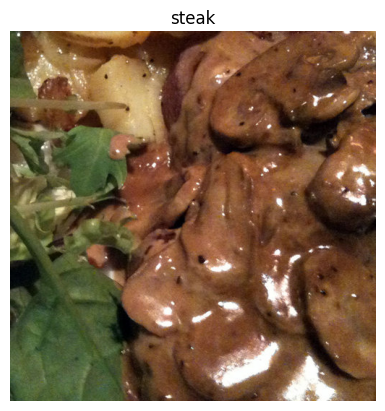

In [10]:
# View a random image from the training dataset
img = view_random_image(target_dir="pizza_steak/train/",
                        target_class="steak")

['1390308.jpg']
Image shape: (384, 512, 3)


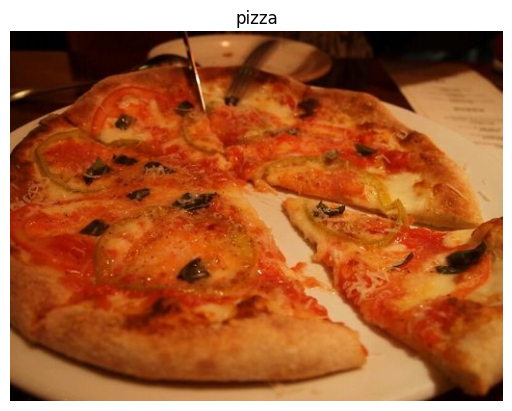

In [11]:
# View a random image from the training dataset
img = view_random_image(target_dir="pizza_steak/train/",
                        target_class="pizza")

In [12]:
# The images we've imported and plotted are actually gaint arrays/tensors of different pixel values
import tensorflow as tf
tf.constant(img)

<tf.Tensor: shape=(384, 512, 3), dtype=uint8, numpy=
array([[[ 7,  1,  1],
        [ 6,  0,  0],
        [ 6,  0,  0],
        ...,
        [13,  2,  0],
        [17,  2,  0],
        [18,  3,  0]],

       [[ 7,  1,  1],
        [ 6,  0,  0],
        [ 6,  0,  0],
        ...,
        [14,  0,  0],
        [17,  2,  0],
        [19,  1,  0]],

       [[ 7,  1,  1],
        [ 6,  0,  0],
        [ 6,  0,  0],
        ...,
        [19,  1,  0],
        [21,  1,  0],
        [22,  3,  0]],

       ...,

       [[ 2,  3,  0],
        [ 2,  3,  0],
        [ 2,  3,  0],
        ...,
        [28,  4,  0],
        [34,  9,  5],
        [39, 14, 10]],

       [[ 1,  1,  0],
        [ 1,  1,  0],
        [ 2,  2,  0],
        ...,
        [29,  5,  1],
        [35, 10,  5],
        [37, 12,  7]],

       [[ 1,  1,  0],
        [ 1,  1,  0],
        [ 1,  1,  0],
        ...,
        [30,  6,  2],
        [34,  9,  4],
        [36, 11,  6]]], dtype=uint8)>

In [13]:
# View the image shape
img.shape # returns width, height, colour channels

(384, 512, 3)

> 🔑**Note:** As we've discussed before, many machine learning models, including neural networks prefer the values they work with to be between 0 and 1. Knowing this, one of the most common preprocessing steps for working with images is to **scale** (also referred to as **normalized**) their pixel values by dividing ithe image arrays by 255. (since 255 is the maximum pixel value).

In [14]:
# Get all the pixel values between 0 and 1 (scale/normalize the data, as neural networks love values between 0 and 1)
img/255

array([[[0.02745098, 0.00392157, 0.00392157],
        [0.02352941, 0.        , 0.        ],
        [0.02352941, 0.        , 0.        ],
        ...,
        [0.05098039, 0.00784314, 0.        ],
        [0.06666667, 0.00784314, 0.        ],
        [0.07058824, 0.01176471, 0.        ]],

       [[0.02745098, 0.00392157, 0.00392157],
        [0.02352941, 0.        , 0.        ],
        [0.02352941, 0.        , 0.        ],
        ...,
        [0.05490196, 0.        , 0.        ],
        [0.06666667, 0.00784314, 0.        ],
        [0.0745098 , 0.00392157, 0.        ]],

       [[0.02745098, 0.00392157, 0.00392157],
        [0.02352941, 0.        , 0.        ],
        [0.02352941, 0.        , 0.        ],
        ...,
        [0.0745098 , 0.00392157, 0.        ],
        [0.08235294, 0.00392157, 0.        ],
        [0.08627451, 0.01176471, 0.        ]],

       ...,

       [[0.00784314, 0.01176471, 0.        ],
        [0.00784314, 0.01176471, 0.        ],
        [0.00784314, 0

## An end-to-end example

Let's build a convolutional neural network to find patterns in our images, more specifically we a need way to:

* Load our images
* Preprocess our images
* Build a CNN to find patterns in our images
* Compile our CNN
* Fit the CNN to our training data.

In [15]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# set the random seed
tf.random.set_seed(42)

# Preprocess data (get all of the pixel values between 0 and 1, also called scaling/normalization)
train_datagen = ImageDataGenerator(rescale=1./255)
valid_datagen = ImageDataGenerator(rescale=1./255)

# setup paths to our data directories
train_dir = "/content/pizza_steak/train"
test_dir =  "/content/pizza_steak/test"

# Import data from directories and turn it into batches
train_data = train_datagen.flow_from_directory(directory = train_dir, batch_size=32,
                                               target_size=(224, 224),
                                               class_mode = "binary",
                                               seed = 42)
valid_data = valid_datagen.flow_from_directory(directory =      test_dir,
  batch_size=32,
  target_size=(224, 224),
  class_mode = "binary",
  seed = 42)

# Build a CNN model (same as the Tiny VGG  on the CNN explainer website)
model_1 = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer"),
    tf.keras.layers.Conv2D(10, 3, activation="relu"),
    tf.keras.layers.Conv2D(10, 3, activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(10, 3, activation="relu"),
    tf.keras.layers.Conv2D(10, 3, activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation="sigmoid", name="output_layer")
], name="cnn_pizza_steak")

# Compile our CNN
model_1.compile(loss='binary_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics = ['accuracy'])

# Fit the model
history_1 = model_1.fit(train_data, epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=valid_data,
                        validation_steps = len(valid_data))

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.
Epoch 1/5


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


47/47 ━━━━━━━━━━━━━━━━━━━━ 16s 221ms/step - accuracy: 0.5891 - loss: 0.6465 - val_accuracy: 0.8040 - val_loss: 0.4265
Epoch 2/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - accuracy: 0.8160 - loss: 0.4159 - val_accuracy: 0.8420 - val_loss: 0.3926
Epoch 3/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step - accuracy: 0.8370 - loss: 0.3839 - val_accuracy: 0.8540 - val_loss: 0.3593
Epoch 4/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step - accuracy: 0.8399 - loss: 0.3708 - val_accuracy: 0.8680 - val_loss: 0.3369
Epoch 5/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - accuracy: 0.8784 - loss: 0.3034 - val_accuracy: 0.8540 - val_loss: 0.3540


> 🔑**Note:** If the above cell is taking longer than ~10 sec per epoch, make sure you're using a GPU by going to Runtime ->
Change Runtime Type -> Hardware Acceletor -> GPU (you may have to return some cells above).

In [16]:
# Get a model summary
model_1.summary()

Model: "cnn_pizza_steak"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 10)   │           280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 220, 220, 10)   │           910 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 110, 110, 10)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 108, 108, 10)   │           910 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 106, 106, 10)   │           910 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 53, 53, 10)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 28090)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 1)              │        28,091 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 93,305 (364.48 KB)

 Trainable params: 31,101 (121.49 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 62,204 (242.99 KB)

## Using the same model as before

Let's replicate the model we've built in a previous section to see if it works with our image data.
The model we're building is from the TensorFlow playground.

In [17]:
# Set random seed
tf.random.set_seed(42)

# Create a model to replicate the Tensorflow Playground model
model_2 = tf.keras.Sequential([
  tf.keras.layers.Input(shape=(224, 224, 3)),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(4, activation='relu'),
  tf.keras.layers.Dense(4, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
model_2.compile(loss='binary_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy'])

# Fit the model
history_2 = model_2.fit(train_data,
                      epochs=5,
                      steps_per_epoch=len(train_data),
                      validation_data=valid_data,
                      validation_steps=len(valid_data))

Epoch 1/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - accuracy: 0.4980 - loss: 0.6990 - val_accuracy: 0.5000 - val_loss: 0.6931
Epoch 2/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step - accuracy: 0.4987 - loss: 0.6931 - val_accuracy: 0.5000 - val_loss: 0.6931
Epoch 3/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - accuracy: 0.5043 - loss: 0.6932 - val_accuracy: 0.5000 - val_loss: 0.6931
Epoch 4/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - accuracy: 0.4895 - loss: 0.6932 - val_accuracy: 0.5000 - val_loss: 0.6931
Epoch 5/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - accuracy: 0.4758 - loss: 0.6933 - val_accuracy: 0.5000 - val_loss: 0.6931


In [18]:
# Get the model_2 summary
model_2.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_1 (Flatten)             │ (None, 150528)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4)              │       602,116 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │            20 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,806,425 (6.89 MB)

 Trainable params: 602,141 (2.30 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,204,284 (4.59 MB)

Despite having 20x more parameters than our CNN (model_1), model_2 performs terribly... let's try to improve it

In [19]:
# Set the random seed
tf.random.set_seed(42)

# Create the model (same as above but let's step it up a notch )
model_3 =tf.keras.Sequential([
  tf.keras.layers.Input(shape=(224, 224, 3)),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid'),
])

# Compile the model
model_3.compile(loss='binary_crossentropy',
                optimizer = tf.keras.optimizers.Adam(),
                metrics=['accuracy'])

# Fit the model
history_3 = model_3.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data = valid_data,
                        validation_steps = len(valid_data))

Epoch 1/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 9s 143ms/step - accuracy: 0.5913 - loss: 3.8746 - val_accuracy: 0.5060 - val_loss: 3.3499
Epoch 2/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step - accuracy: 0.6133 - loss: 2.5438 - val_accuracy: 0.7140 - val_loss: 0.6246
Epoch 3/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.7725 - loss: 0.5090 - val_accuracy: 0.6980 - val_loss: 0.8640
Epoch 4/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - accuracy: 0.7136 - loss: 0.7496 - val_accuracy: 0.7100 - val_loss: 0.6559
Epoch 5/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - accuracy: 0.7285 - loss: 0.5873 - val_accuracy: 0.5940 - val_loss: 0.8904


In [20]:
# Get a summary of model_3
model_3.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_2 (Flatten)             │ (None, 150528)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 100)            │    15,052,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │           101 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 45,219,605 (172.50 MB)

 Trainable params: 15,073,201 (57.50 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 30,146,404 (115.00 MB)

> 🔑**Note:** You can think of trainable parameters as **patterns a model can learn from data**. Intuitively, you might think more is better. And in lots of cases,it is. But in this case, the difference here is the two different styles of model we're using. Where a series of dense layers has a number of different learnable parameters connected to each other and hence a higher number of possible learnable patterns, **a convolutional neural network seeks to sort out and learn the most important patterns in an image**. So even though these are less learnable parameters in our convolutional neural network, these are often more helpful in dechiphering between different **features** in an image.

In [21]:
model_1.summary()

Model: "cnn_pizza_steak"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 10)   │           280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 220, 220, 10)   │           910 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 110, 110, 10)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 108, 108, 10)   │           910 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 106, 106, 10)   │           910 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 53, 53, 10)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 28090)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 1)              │        28,091 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 93,305 (364.48 KB)

 Trainable params: 31,101 (121.49 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 62,204 (242.99 KB)

## Binary Classification: Let's break it down

1. Become one with data (visualize, visualize, ....)
2. Preprocess the data (prepared it for our model, the main step here was scaling/normalizing and turing data into batches)
3. Create a model (start with a baseline)
4. Fit the model
5. Evaluate the model
6. Adjust different parameters and improve the model (try to beat our baseline)
7. Repeat until satisfied (experiment, experiment, ...)

### 1. Become one with the data

['732986.jpg']
Image shape: (512, 512, 3)
['218142.jpg']
Image shape: (512, 382, 3)


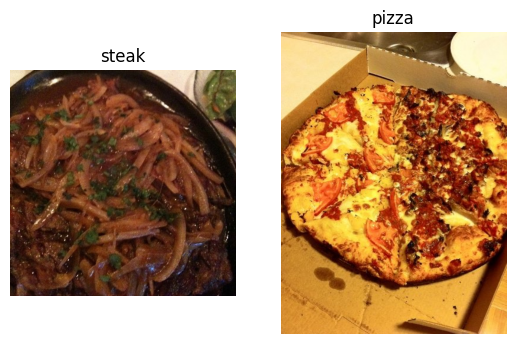

In [22]:
# Visualize data
plt.figure()
plt.subplot(1,2,1)
steak_img = view_random_image("pizza_steak/train/", "steak")
plt.subplot(1,2,2)
pizza_imag = view_random_image("pizza_steak/train/", "pizza")

### 2. Preprocess the data (prepare if for a model)

In [23]:
# Define directory dataset paths
train_dir = "pizza_steak/train/"
test_dir = "pizza_steak/test/"

Our next step is to turn our data into **batches**.

A batch is a small subset of data. Rather than look at all ~10,000 or more images at one time, a model might only look at 32 at a time.

It does this for a couple of reasons:
1. 10,000 images (or more) might not fit into the memory of your processor (GPU).
2. Trying to learn the patterns in 10,000 images in one hit could result in the model not being able to learn very well.

Why 32?
Because 32 is good for your health.... that's jokes part, It is recommended by **Founder of CNN**

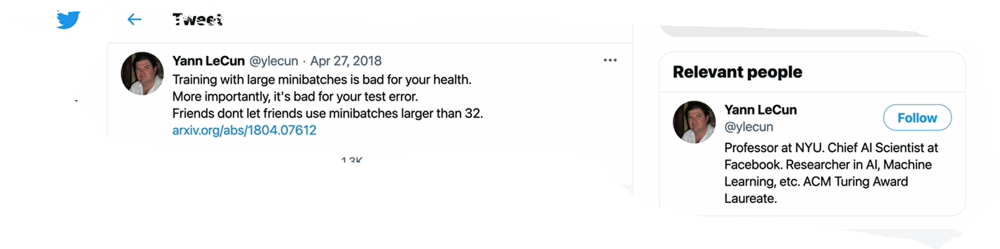

In [24]:
# Create train and test data generators and rescale the data
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1/255.)
test_datagen = ImageDataGenerator(rescale=1/255.)


In [25]:
# Load in our image data from directories and turn into batches
train_data = train_datagen.flow_from_directory(
  directory=train_dir, # Target directory of images
  target_size=(224, 224), # Target size of images (height, width)
  class_mode="binary", #type of data you're working with
  batch_size=32) # size of minibatches to load data into

test_data = test_datagen.flow_from_directory(
  directory=test_dir,
  target_size=(224, 224),
  class_mode="binary",
  batch_size=32)

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.


In [26]:
# Get a sample of a train data batch
images, labels = next(train_data) # get the "next" batch of images/labels in train_data
len(images), len(labels)

(32, 32)

In [27]:
# How many batches are there?
len(train_data)

47

In [28]:
1500/32

46.875

In [29]:
# Get the first two images
images[:2], images[0].shape

(array([[[[0.56078434, 0.63529414, 0.79215693],
          [0.5647059 , 0.6392157 , 0.7960785 ],
          [0.5647059 , 0.6392157 , 0.80392164],
          ...,
          [0.07843138, 0.08235294, 0.05882353],
          [0.08235294, 0.08235294, 0.07450981],
          [0.09803922, 0.09803922, 0.09803922]],
 
         [[0.5647059 , 0.6392157 , 0.7960785 ],
          [0.5568628 , 0.6313726 , 0.7960785 ],
          [0.5568628 , 0.6313726 , 0.7960785 ],
          ...,
          [0.09803922, 0.10196079, 0.07058824],
          [0.0627451 , 0.06666667, 0.04705883],
          [0.04313726, 0.04313726, 0.03529412]],
 
         [[0.5686275 , 0.6431373 , 0.8078432 ],
          [0.5647059 , 0.6392157 , 0.80392164],
          [0.5647059 , 0.6392157 , 0.8078432 ],
          ...,
          [0.07450981, 0.07843138, 0.04705883],
          [0.15686275, 0.16078432, 0.13725491],
          [0.21568629, 0.21960786, 0.20000002]],
 
         ...,
 
         [[0.3921569 , 0.34901962, 0.22352943],
          [0.39607

In [30]:
# View the first batch of labels
labels

array([0., 1., 1., 0., 1., 0., 1., 1., 0., 1., 0., 0., 1., 1., 1., 0., 0.,
       0., 0., 1., 1., 1., 0., 0., 0., 0., 1., 1., 0., 1., 0., 1.],
      dtype=float32)

### 3. Create a CNN model (start with a baseline)

A baseline is a relatively simple model or existing result that u setup when beginning a machine learning experiment and then as you keep experimenting, you try to beat the baseline.

>🔑**Note:**  In deep learning, there is almost an infinite amount of architecture you could create. So one of the best ways to get started is to start with something simple and see if it works on your data and then introdue complexity as required (e.g. look at which current model is performing best in the field for your problem).

In [31]:
# Make the creating of our model a little easier
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Input, Flatten, Conv2D, MaxPool2D, Activation
from tensorflow.keras import Sequential

In [32]:
# Creat the model (this wil be our baseline, a 3 layer CNN)
model_4 = Sequential([
  Input(shape=(224, 224, 3)), # input layer (specify input shape)
  Conv2D(filters=10,
         kernel_size=3,
         strides=1,
         padding='valid',
         activation='relu',
        #  input_shape=(224, 224, 3)  # already passed above
        ),
  Conv2D(10, 3, activation='relu'),
  Conv2D(10, 3, activation='relu'),
  Flatten(),
  Dense(1, activation='sigmoid') # output layer (working with binary classification so only 1 output neuron)
])

In [33]:
# Compile the model
model_4.compile(loss='binary_crossentropy',
                optimizer = Adam(),
                metrics = ['accuracy'])

In [34]:
# Get a summary of our model
model_4.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 222, 222, 10)   │           280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 220, 220, 10)   │           910 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 218, 218, 10)   │           910 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 475240)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │       475,241 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 477,341 (1.82 MB)

 Trainable params: 477,341 (1.82 MB)

 Non-trainable params: 0 (0.00 B)

### 4.Fit the model


In [35]:
# Check the lengths of training and test data generator
len(train_data), len(test_data)

(47, 16)

In [36]:
# Fit the model
history_4 = model_4.fit(train_data, # this is a combination of labels and sample data
            epochs=5,
            steps_per_epoch=len(train_data),
            validation_data = test_data,
            validation_steps = len(test_data))

Epoch 1/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 178ms/step - accuracy: 0.6025 - loss: 1.7625 - val_accuracy: 0.7140 - val_loss: 0.5344
Epoch 2/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - accuracy: 0.7902 - loss: 0.4694 - val_accuracy: 0.8300 - val_loss: 0.3922
Epoch 3/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 10s 122ms/step - accuracy: 0.8444 - loss: 0.3528 - val_accuracy: 0.8260 - val_loss: 0.3840
Epoch 4/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step - accuracy: 0.8886 - loss: 0.3010 - val_accuracy: 0.8580 - val_loss: 0.3312
Epoch 5/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - accuracy: 0.9434 - loss: 0.1819 - val_accuracy: 0.7760 - val_loss: 0.4363


### 5. Evaluate our model

It looks like our model is learning something, let's evaluate it.

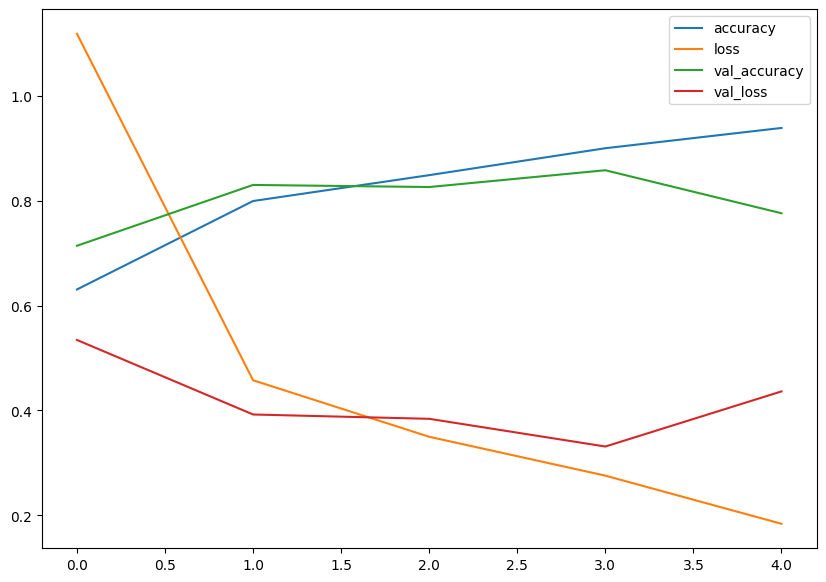

In [37]:
# Let's plot the training curve
import pandas as pd
pd.DataFrame(history_4.history).plot(figsize=(10, 7));

In [38]:
# Plot the Validation and training curves separately
def plot_loss_curves(history ):
  """
  Returns separate loss curves for training and validation metrics.
  """
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss'])) # how many epochs did we run for?

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('loss')
  plt.xlabel('epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('accuracy')
  plt.xlabel('epochs')
  plt.legend();

>🔑**Note:** When a model's **validation loss starts to increase**, it's likely that the model is **overfitting** the training dataset. This means, it's learning the patterns in the training dataset *too well* and thus the model's ability to generalize to unseen data will be diminished.

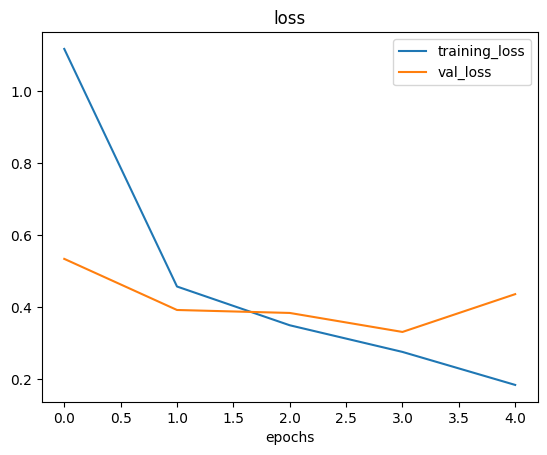

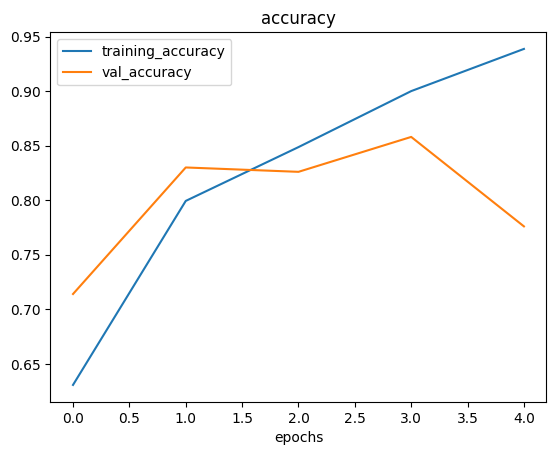

In [39]:
# Check out the loss and accuracy of model_4
plot_loss_curves(history_4)

>🔑**Note:** Ideally the two loss curves (training and validation) will be very similar to each other (training loss and validation loss decreasing at similar rates), when there are large difference you model may be **overfitting**.

### 6. Adjust the model parameters

Fitting a machine learning model comes in 3 steps:
0. Create a baseline
1.   Beat the baseline by overfitting a larger model
2.   Reduce overfitting

Ways to induce overfitting:
* Add data augmentation
* Add regularization layers (such as MaxPool2D)
* Add more data...

>🔑**Note:** Reducing overfitting is also known as **regularization**.


In [40]:
# Create the model (this is going to be new baseline)
model_5 = Sequential([
  # Input(shape=(224, 224, 3)),
  Conv2D(10, 3, activation='relu', input_shape=(224,224,3)),
  MaxPool2D(pool_size=2),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Flatten(),
  Dense(1, activation='sigmoid')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [41]:
# Compile the model
model_5.compile(loss='binary_crossentropy',
                optimizer = Adam(),
                metrics = ['accuracy'])

In [42]:
# Fit the model
history_5 = model_5.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data = test_data,
                        validation_steps=len(test_data))

Epoch 1/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - accuracy: 0.6662 - loss: 0.6179 - val_accuracy: 0.7540 - val_loss: 0.5124
Epoch 2/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 104ms/step - accuracy: 0.7920 - loss: 0.4896 - val_accuracy: 0.8400 - val_loss: 0.3927
Epoch 3/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - accuracy: 0.8205 - loss: 0.4187 - val_accuracy: 0.8480 - val_loss: 0.3335
Epoch 4/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.8246 - loss: 0.3875 - val_accuracy: 0.8700 - val_loss: 0.3389
Epoch 5/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - accuracy: 0.8451 - loss: 0.3730 - val_accuracy: 0.8540 - val_loss: 0.3419


In [43]:
# Get a summary of our model with max pooling
model_5.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_7 (Conv2D)               │ (None, 222, 222, 10)   │           280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 111, 111, 10)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 109, 109, 10)   │           910 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 54, 54, 10)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 52, 52, 10)     │           910 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 26, 26, 10)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 6760)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │         6,761 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 26,585 (103.85 KB)

 Trainable params: 8,861 (34.61 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,724 (69.24 KB)

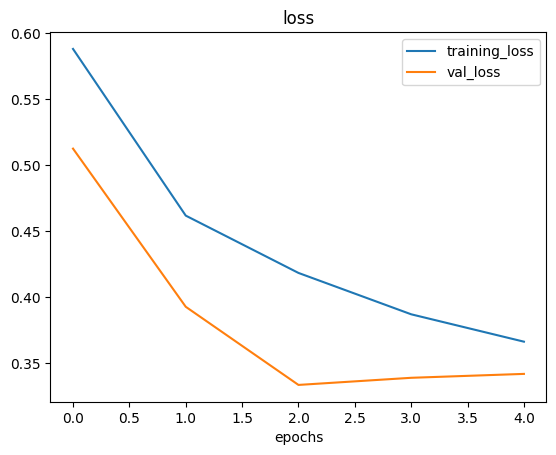

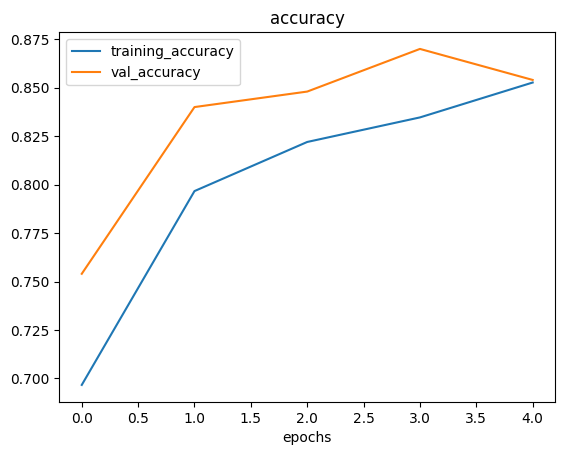

In [44]:
# Plot loss curves
plot_loss_curves(history_5)

### Opening our bag of tricks and finding data augmentation

In [45]:
# Create ImageDataGenerator training instance with data augmentation
train_datagen_augmented = ImageDataGenerator(rescale=1/255.,
  rotation_range=0.2, # how much do u want to rotate an image?
  shear_range=0.2, # how much do u want to shear an image?
  zoom_range=0.2, # zoom in randomly on an image
  width_shift_range=0.2, # move your image around on the x-axis
  height_shift_range=0.2,# move your image around on the y-axis
  horizontal_flip=True) # do u want to flip and image?

# Create ImageDataGenerator without data augmentation
tain_datagen = ImageDataGenerator(rescale=1/255.)
test_datagen = ImageDataGenerator(rescale=1/255.)

>🤔 **Question:** What is data augmentation?

Looking at the same image but from different perspective(s)*.

Data augmentation is the process of altering our training data, leading it to have more diversity and in turn allowing our models to learn more generalizable (hopefully) patterns. Altering might mean adjusting the rotation of an image, flipping it, cropping it or something similar.

Let's write some code to visualize data augmentation...

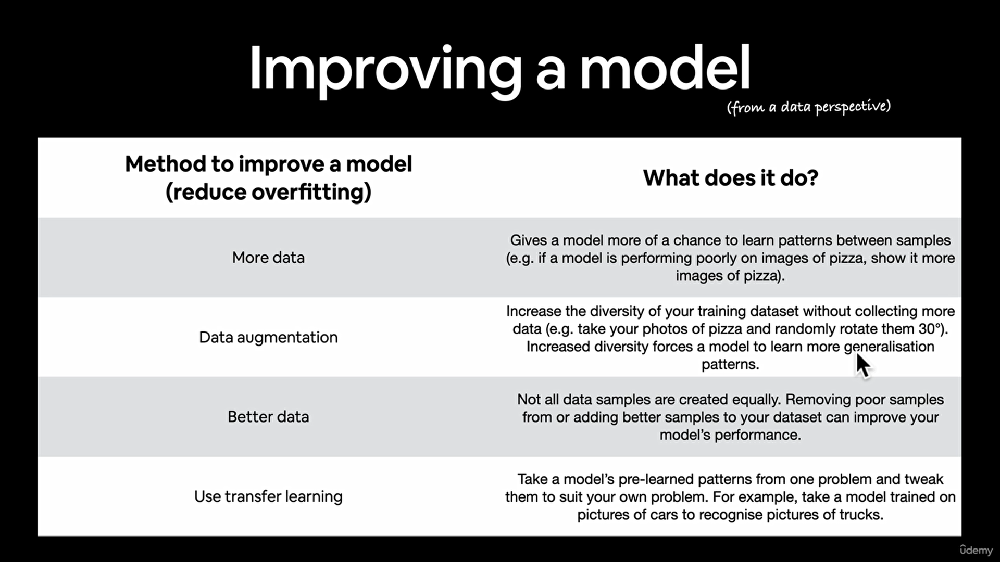

In [46]:
# Import data and augment it from training directory
print("Augmented training data:")
train_data_augmented = train_datagen_augmented.flow_from_directory(
    train_dir,target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    shuffle=False)# for demonstration purposes only


# Create non-augmented train data batches
print("Non-augmented training data:")
train_data = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    shuffle=False)

# Create non-augmented test data batches
IMG_SIZE = (224, 224)
print("Non-augmented test data:")
test_data = test_datagen.flow_from_directory(
    test_dir,
    target_size=IMG_SIZE,
    batch_size=32,
    class_mode='binary')

Augmented training data:
Found 1500 images belonging to 2 classes.
Non-augmented training data:
Found 1500 images belonging to 2 classes.
Non-augmented test data:
Found 500 images belonging to 2 classes.


>🔑**Note:** Data augmentation is usually only performed on  the training data. Using `ImageDataGenerator` built-in data augmentation parameters our images are left as they are in the directories but are modified as they're loaded into the model.

Finally...let's visulize some augmented data!!!

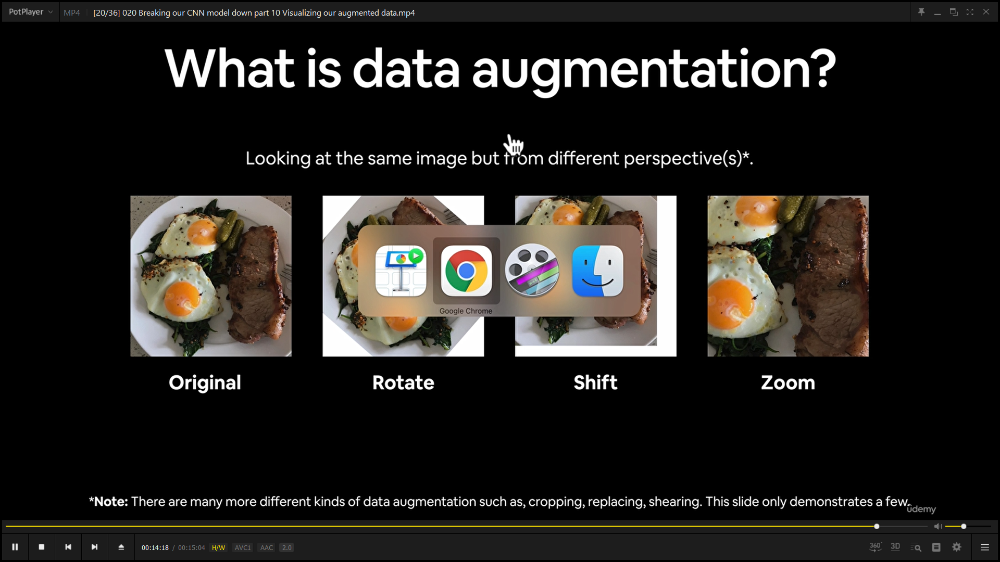

In [47]:
# Get sample data batches
images, labels = next(train_data)
augmented_images, augmented_labels = next(train_data_augmented) # note: labels aren't augmented... only data (images)

showing image number: 22


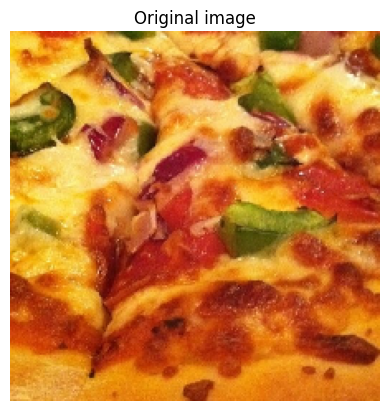

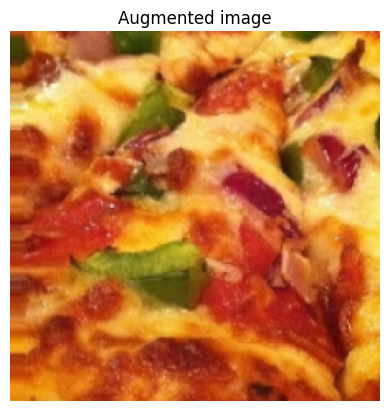

In [48]:
# Show original image and augmented image
import random
random_number = random.randint(0, 32) # our batch sizes are 32...
print(f"showing image number: {random_number}")
plt.imshow(images[random_number])
plt.title(f"Original image")
plt.axis(False)
plt.figure()
plt.imshow(augmented_images[random_number])
plt.title(f"Augmented image")
plt.axis(False);

Now we've seen what augmented training data looks like, let's build a model and see how it learns on augmented data.

In [49]:
# Create a model (same as model_5)
model_6 = Sequential([
  Input(shape=(224, 224, 3)),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(pool_size=2),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Flatten(),
  Dense(1, activation='sigmoid')
])

# Compile the model
model_6.compile(loss='binary_crossentropy',
                optimizer = Adam(),
                metrics = ['accuracy'])

# Fit the model
history_6 = model_6.fit(train_data_augmented, # fitting model_6 on augmented training data
                  epochs=5,
                  steps_per_epoch=len(train_data_augmented),
                  validation_data = test_data,
                  validation_steps=len(test_data))

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 24s 469ms/step - accuracy: 0.4188 - loss: 0.7562 - val_accuracy: 0.5640 - val_loss: 0.6892
Epoch 2/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 21s 443ms/step - accuracy: 0.5365 - loss: 0.6921 - val_accuracy: 0.6400 - val_loss: 0.6817
Epoch 3/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 41s 439ms/step - accuracy: 0.6115 - loss: 0.6817 - val_accuracy: 0.5000 - val_loss: 0.6776
Epoch 4/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 42s 455ms/step - accuracy: 0.5326 - loss: 0.6784 - val_accuracy: 0.7820 - val_loss: 0.6100
Epoch 5/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 40s 438ms/step - accuracy: 0.6764 - loss: 0.6449 - val_accuracy: 0.7520 - val_loss: 0.5423


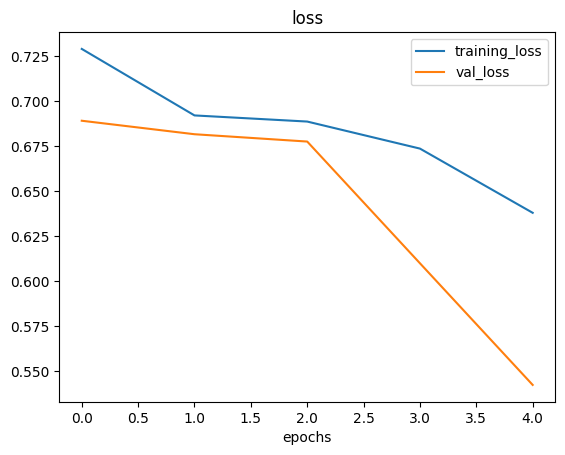

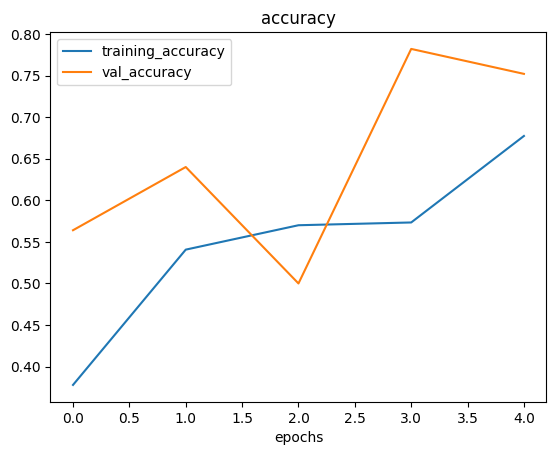

In [50]:
# check our model_6 training curve
plot_loss_curves(history_6)

Let's shuffle our augmented training data and train another model(the same as before) on it and see what happens.

In [51]:
# Import data and augment it and suffle from training directory
train_data_augmented_shuffled = train_datagen_augmented.flow_from_directory(train_dir,
  target_size=(224, 224),
  class_mode="binary",
  batch_size=32,
  shuffle=True) # shuffle data this time

Found 1500 images belonging to 2 classes.


In [52]:
# Create the model (same as model_5 and model_6)
model_7 = Sequential([
  Input(shape=(224, 224, 3)),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Flatten(),
  Dense(1, activation='sigmoid')
])

# Compile the model
model_7.compile(loss='binary_crossentropy',
                optimizer = Adam(),
                metrics = ['accuracy'])

# Fit the model
history_7 = model_7.fit(train_data_augmented_shuffled, # fitting model_7 on augmented shuffled training data
                  epochs=5,
                  steps_per_epoch=len(train_data_augmented_shuffled),
                  validation_data = test_data,
                  validation_steps=len(test_data))

Epoch 1/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 23s 447ms/step - accuracy: 0.5362 - loss: 0.6850 - val_accuracy: 0.5700 - val_loss: 0.6420
Epoch 2/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 38s 413ms/step - accuracy: 0.7007 - loss: 0.5846 - val_accuracy: 0.7640 - val_loss: 0.4796
Epoch 3/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 21s 426ms/step - accuracy: 0.7573 - loss: 0.5020 - val_accuracy: 0.8260 - val_loss: 0.3830
Epoch 4/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 20s 431ms/step - accuracy: 0.7776 - loss: 0.4624 - val_accuracy: 0.8560 - val_loss: 0.3829
Epoch 5/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 19s 414ms/step - accuracy: 0.7939 - loss: 0.4455 - val_accuracy: 0.8360 - val_loss: 0.3736


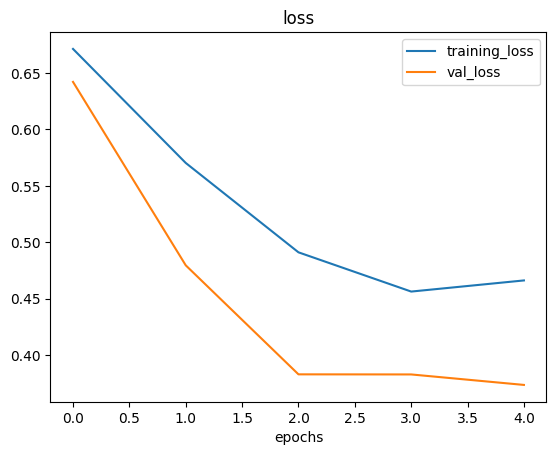

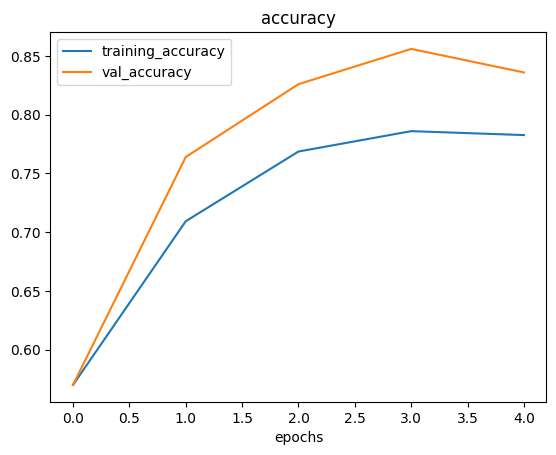

In [53]:
# Plot the loss curves
plot_loss_curves(history_7)

>🔑**Note:** When suffling training data, the model gets exposed to all different kinds of data during training, thus enabling it to learn features across a wide array of images (in our case, pizza & steak at the same time instead of just pizza then steak.


### 7. Repeat until satisfied

Since we've already beaten our baseline, there are a few things we could try to continue to improve our model:

* Increase the number of model layers (e.g. add more `Conv2D`/`MaxPool2D` layers)
* Increase the number of filters in each convolutional layer (e.g.from 10 to 32 or even 64)
* Train for longer (more epochs)
* Find an ideal learning rate
* Get more data (give the model more opportunities to learn)
* Use **transfer learning** to leverage what another image model has learn and adjust it for our own use case.

## Making a prediction with our trained model on our own custom data

In [54]:
# Classes we're working with
print(class_names)

['pizza' 'steak']


In [55]:
# view our example image
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/images/03-steak.jpeg   # must be raw otherwise it don't work

--2025-06-24 11:07:47--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/images/03-steak.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1978213 (1.9M) [image/jpeg]
Saving to: ‘03-steak.jpeg’

03-steak.jpeg       100%[===================>]   1.89M  --.-KB/s    in 0.05s   

2025-06-24 11:07:47 (39.9 MB/s) - ‘03-steak.jpeg’ saved [1978213/1978213]



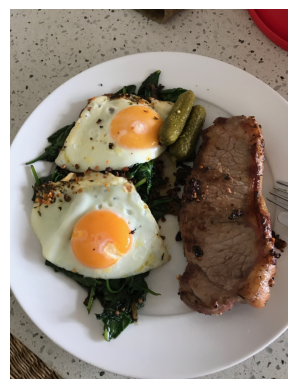

In [56]:
steak = mpimg.imread("03-steak.jpeg")
plt.imshow(steak)
plt.axis(False);

In [57]:
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/images/03-pizza-dad.jpeg

--2025-06-24 11:07:49--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/images/03-pizza-dad.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2874848 (2.7M) [image/jpeg]
Saving to: ‘03-pizza-dad.jpeg’

03-pizza-dad.jpeg   100%[===================>]   2.74M  --.-KB/s    in 0.04s   

2025-06-24 11:07:49 (69.5 MB/s) - ‘03-pizza-dad.jpeg’ saved [2874848/2874848]



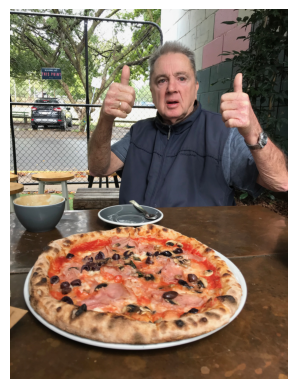

In [58]:
pizza_dad = mpimg.imread("03-pizza-dad.jpeg")
plt.imshow(pizza_dad)
plt.axis(False);

In [59]:
# Check the shape of our image
steak.shape, pizza_dad.shape

((4032, 3024, 3), (4032, 3024, 3))

>🔑**Note:** When you train a neural network and you want to make prediction with it on your own custom data, it's important than you custom data(or new data) is preprocessed into the same format as the data your model was trained on.

In [60]:
# Create a function to import and image and resize it to able to be used with our model
def load_and_prep_image(filename, img_shape=224):
  """
  Reads an image from filename, turns it into a tensor and reshape it to (image_shape, imag_shape, colour_channels).
  """
  # Read in the image
  img = tf.io.read_file(filename)
  # Decode the read file into a tensor
  img = tf.image.decode_image(img)
  # Resize the image
  img = tf.image.resize(img, size=[img_shape, img_shape])
  # Rescale the image (get all values between 0 and 1)
  img = img/255
  return img

In [61]:
# Load in and preprocess our custom image
steak = load_and_prep_image("03-steak.jpeg")
pizza_dad = load_and_prep_image("03-pizza-dad.jpeg")

In [62]:
expanded_steak = tf.expand_dims(steak, axis=0)
expanded_pizza_dad = tf.expand_dims(pizza_dad, axis=0)

In [63]:
pred1 = model_7.predict(expanded_steak)
pred2 = model_7.predict(expanded_pizza_dad)
pred1, pred2

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


(array([[0.90733117]], dtype=float32), array([[0.59020364]], dtype=float32))

Looks like our custom image is being put through our model, however, it currently outputs a prediction probability, wouldn't it be nice if we could visualize the image as well as the model's prediction?

In [64]:
# Remind ourselves of our class names
class_names

array(['pizza', 'steak'], dtype='<U5')

In [65]:
# We can index the predicted class by rounding the prediction probability and indexing it on the class names
pred_class1 = class_names[int(tf.round(pred1))]
pred_class2 = class_names[int(tf.round(pred2))]
pred_class1, pred_class2

(np.str_('steak'), np.str_('steak'))

In [66]:
def pred_and_plot(model, filename, class_names=class_names):
  """
  Imports an image located at filename, makes a prediction with model and plots the image with the predicted class as the title
  """
  # Import the target image and preprocess it
  img = load_and_prep_image(filename)

  # Make a prediction
  pred = model.predict(tf.expand_dims(img, axis=0))

  # Get the predicted class
  pred_class = class_names[int(tf.round(pred))]

  # Plot the image and predicted class
  plt.imshow(img)
  plt.title(f"Prediction: {pred_class}")
  plt.axis(False);

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


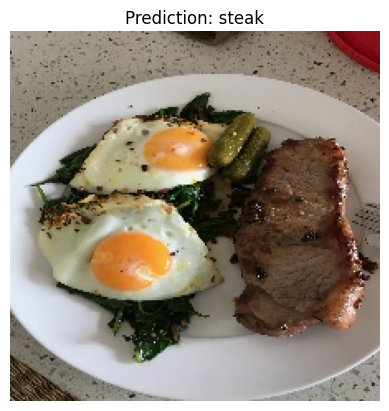

In [67]:
# Test our model on a custom image
pred_and_plot(model_7, "03-steak.jpeg")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


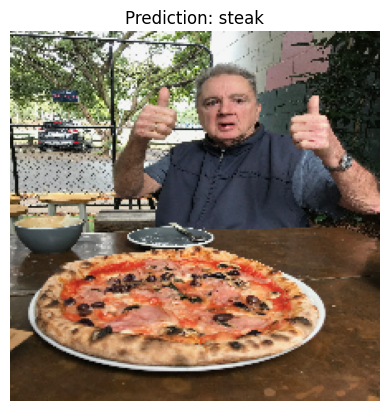

In [68]:
pred_and_plot(model_7, "03-pizza-dad.jpeg")

# Multi-class Image Classification

We've just been through a bunch of the following steps with a binary classification problem (pizza vs. steak), now we're going to step things up a notch with 10 classes of food (multi-class classification).

1. Become one with the data.
2. Preprocess the data (get it ready for a model)
3. Create a model (start with a baseline)
4. Fit the model (overfit it to make sure it works)
5. Evaluate the model
6. Adjust different hyperparameters and improve the model (try to beat baseline/reduce overfitting)
7. Repeat until satisfied

## Import and become one with the data

In [69]:
import zipfile
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip

# Unzip our data
zip_ref = zipfile.ZipFile("10_food_classes_all_data.zip", "r")
zip_ref.extractall()
zip_ref.close()

--2025-06-24 11:07:52--  https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.101.207, 142.251.2.207, 142.250.141.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.101.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 519183241 (495M) [application/zip]
Saving to: ‘10_food_classes_all_data.zip’

10_food_classes_all 100%[===================>] 495.13M  16.5MB/s    in 7.1s    

2025-06-24 11:07:59 (69.7 MB/s) - ‘10_food_classes_all_data.zip’ saved [519183241/519183241]



In [70]:
import os
# Walk through 10 classes of food image data
for dirpath, dirnames, filenames in os.walk("10_food_classes_all_data"):
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

There are 2 directories and 0 images in '10_food_classes_all_data'.
There are 10 directories and 0 images in '10_food_classes_all_data/test'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/steak'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/grilled_salmon'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/chicken_curry'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/ice_cream'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/pizza'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/sushi'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/ramen'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/fried_rice'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/chicken_wings'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/hamburger'.
There are 

In [71]:
!ls -la 10_food_classes_all_data/

total 16
drwxr-xr-x  4 root root 4096 Jun 24 11:07 .
drwxr-xr-x  1 root root 4096 Jun 24 11:07 ..
drwxr-xr-x 12 root root 4096 Jun 24 11:07 test
drwxr-xr-x 12 root root 4096 Jun 24 11:07 train


In [72]:
# Setup the train and test directories
train_dir = "10_food_classes_all_data/train/"
test_dir = "10_food_classes_all_data/test/"

In [73]:
# Let's get the class names
import pathlib
import numpy as np

data_dir = pathlib.Path(train_dir)
class_names = np.array(sorted([item.name for item in data_dir.glob('*')]))
print(class_names)

['chicken_curry' 'chicken_wings' 'fried_rice' 'grilled_salmon' 'hamburger'
 'ice_cream' 'pizza' 'ramen' 'steak' 'sushi']


['3101158.jpg']
Image shape: (512, 512, 3)


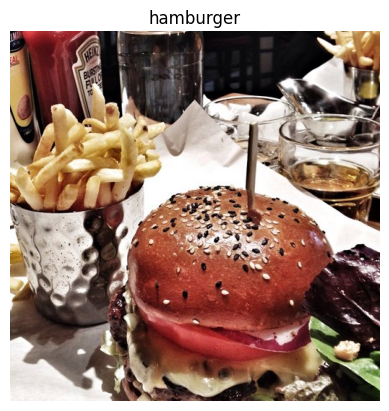

In [74]:
# Visualize, visualize, visualize
import random
img= view_random_image(target_dir=train_dir,
                       target_class=random.choice(class_names))

In [75]:
random.choice(class_names)

np.str_('fried_rice')

In [76]:
len(train_data), len(test_data)

(47, 16)

### 2. Preprocess the data (prepare it for a model)

In [77]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# Rescale
train_datagen = ImageDataGenerator(rescale=1/255.)
test_datagen = ImageDataGenerator(rescale=1/255.)

# Load data in form directories and turn it into batches
train_data = train_datagen.flow_from_directory(
  train_dir,
  target_size=(224, 224),
  batch_size=32,
  class_mode = "categorical"
  )

test_data = test_datagen.flow_from_directory(
  test_dir,
  target_size=(224, 224),
  batch_size=32,
  class_mode = "categorical"
 )

Found 7500 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.


### Create a model (start with a baseline)
we've been talking a lot about the CNN explainer website... how about we just take their model (also on 10 classes) and use it for our problem?

In [78]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Activation

In [79]:
# Create our model (very similar to previous  models but actually the same as CNN explainer website)

model_8 = Sequential([
  Input(shape=(224, 224, 3)),
  Activation(activation='relu'),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Flatten(),
  Dense(10, activation='softmax') # changed to have 10 output neruons and use the softmax activation function
])

# Compile the model
model_8.compile(loss='categorical_crossentropy',
                optimizer = Adam(),
                metrics = ['accuracy'])


In [80]:
# Fit the model
history_8 = model_8 .fit(train_data, # fitting model_8 on training data with 10 different classes
  epochs=5,
  steps_per_epoch=len(train_data),
  validation_data = test_data,
  validation_steps=len(test_data))

Epoch 1/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - accuracy: 0.1618 - loss: 2.2173 - val_accuracy: 0.2948 - val_loss: 1.9747
Epoch 2/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 25s 107ms/step - accuracy: 0.3028 - loss: 1.9567 - val_accuracy: 0.3452 - val_loss: 1.8699
Epoch 3/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - accuracy: 0.3781 - loss: 1.8103 - val_accuracy: 0.3684 - val_loss: 1.8082
Epoch 4/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - accuracy: 0.4394 - loss: 1.6495 - val_accuracy: 0.3848 - val_loss: 1.8102
Epoch 5/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - accuracy: 0.5027 - loss: 1.4954 - val_accuracy: 0.3720 - val_loss: 1.8372


### 5. Evaluate the model

In [81]:
# Evaluate on the test data
model_8.evaluate(test_data)

79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - accuracy: 0.3607 - loss: 1.8462


[1.8371964693069458, 0.3720000088214874]

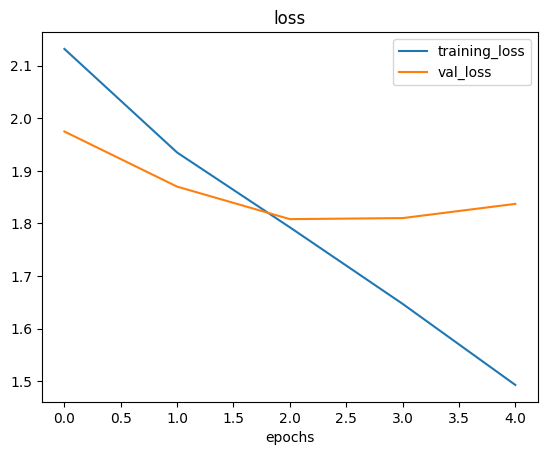

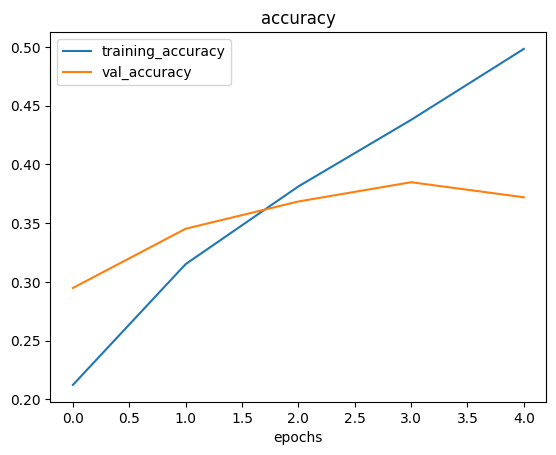

In [82]:
# Check out the model's loss curves on the 10 classes
plot_loss_curves(history_8)

What do these loss curves tell us?

Well... it seems our model is **overfitting** the training set quite badly..in other words, it's getting great results on the training data but fails to generalize well to unseen data and performs poorly on the test dataset.

### 6. Adjust the model hyperparameters (to beat the baseline/reduce overfitting)

Due to its performance on the training data, it's clear our model is learning something...

However, it's not generalizing well to unseen data (overfitting).

So, let's try and fix overfitting by...

* **Get more data** - having more data gives a model more opportunity to learn diverse pattern...
* **Simplify the model** - if our current model is overfitting the data, it may be too complicated of a model, one way to simplify a model is to: reduce # of layers or reduce  # hidden units in layers
* **Use data augmentation** - data augmentation manipulates the training data in such a way to add more diversity to it (without altering the original data)
* **Use transfer learning** - transfer learning leverages the patterns another model has learned on similar data to your own and allows you to use those patterns on your own dataset.

In [84]:
# How about we try and simplify the model first?
# Let's try to remove 2 convolutional layers...
model_9 = Sequential([
  Input(shape=(224, 224, 3)),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Flatten(),
  Dense(10, activation='softmax')
])

model_9.compile(loss='categorical_crossentropy',
                optimizer = Adam(),
                metrics = ['accuracy'])

In [85]:
model_9.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_19 (Conv2D)              │ (None, 222, 222, 10)   │           280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 111, 111, 10)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 109, 109, 10)   │           910 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 54, 54, 10)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_8 (Flatten)             │ (None, 29160)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 10)             │       291,610 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 292,800 (1.12 MB)

 Trainable params: 292,800 (1.12 MB)

 Non-trainable params: 0 (0.00 B)

In [86]:
# Fit the model with 2x conv layers removed
history_9 = model_9.fit(
  train_data,
  epochs=5,
  steps_per_epoch=len(train_data),
  validation_data=test_data,
  validation_steps = len(test_data)
)

Epoch 1/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - accuracy: 0.1565 - loss: 2.8692 - val_accuracy: 0.2356 - val_loss: 2.0845
Epoch 2/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - accuracy: 0.3666 - loss: 1.8463 - val_accuracy: 0.2804 - val_loss: 2.0343
Epoch 3/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step - accuracy: 0.5323 - loss: 1.4356 - val_accuracy: 0.3032 - val_loss: 2.0580
Epoch 4/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - accuracy: 0.7075 - loss: 0.9708 - val_accuracy: 0.3012 - val_loss: 2.2550
Epoch 5/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - accuracy: 0.8493 - loss: 0.5502 - val_accuracy: 0.2952 - val_loss: 2.6744


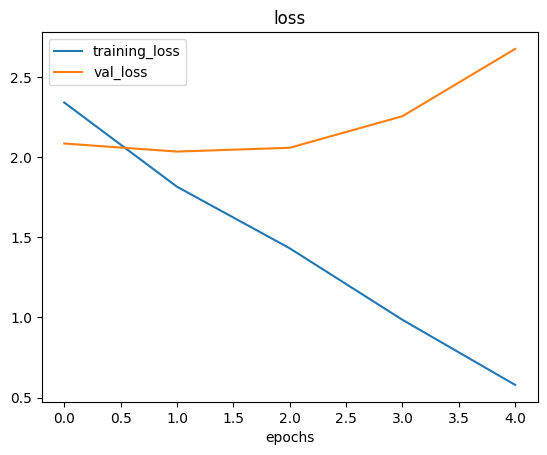

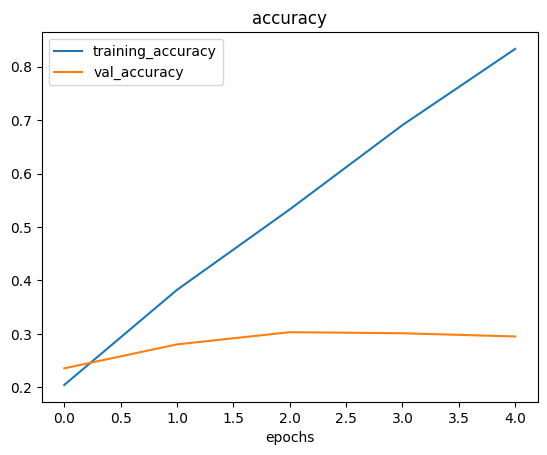

In [87]:
# Check out the loss curves of model_9
plot_loss_curves(history_9)

In [88]:
model_9.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_19 (Conv2D)              │ (None, 222, 222, 10)   │           280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 111, 111, 10)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 109, 109, 10)   │           910 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 54, 54, 10)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_8 (Flatten)             │ (None, 29160)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 10)             │       291,610 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 878,402 (3.35 MB)

 Trainable params: 292,800 (1.12 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 585,602 (2.23 MB)

In [89]:
model_8.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ activation (Activation)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 222, 222, 10)   │           280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 111, 111, 10)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 109, 109, 10)   │           910 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 54, 54, 10)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 52, 52, 10)     │           910 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 26, 26, 10)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 6760)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 10)             │        67,610 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 209,132 (816.93 KB)

 Trainable params: 69,710 (272.30 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 139,422 (544.62 KB)

Looks like our "simplifying the model" experiment didn't work.. the accuracy went down and overfitting continued...
How about we try data augmentation??

### Trying to reduce overfitting by using data augmentation

Let's try and improve our model's results by using augented training data...
Ideally, we want to:
* Reduce overfitting (get the train and validation loss curves closer)
* Improve validataion accuracy

In [91]:
# Create an augmented data generator instance
train_data_augmented = ImageDataGenerator(
  rescale = 1/255.,
  rotation_range=0.2,
  width_shift_range=0.2,
  height_shift_range=0.2,
  zoom_range=0.2,
  horizontal_flip=True
)

train_data_augmented = train_data_augmented.flow_from_directory(
  train_dir,
  target_size=(224, 224),
  batch_size = 32,
  class_mode="categorical"
)

Found 7500 images belonging to 10 classes.


In [92]:
# Let's create another model but this time we'll fit it on the augmented training data of 10 classes
model_10 = tf.keras.models.clone_model(model_8)

# Compile the cloned model (using the same setup as previous models)
model_10.compile(
  loss="categorical_crossentropy",
  optimizer = Adam(),
  metrics = ['accuracy'])

In [95]:
# Fit the model
history_10 = model_10.fit(
  train_data_augmented,
  epochs=5,
  steps_per_epoch=len(train_data_augmented),
  validation_data=test_data,
  validation_steps = len(test_data)
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 102s 422ms/step - accuracy: 0.1364 - loss: 2.2606 - val_accuracy: 0.2724 - val_loss: 2.0479
Epoch 2/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 141s 423ms/step - accuracy: 0.2597 - loss: 2.0811 - val_accuracy: 0.3412 - val_loss: 1.8977
Epoch 3/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 99s 421ms/step - accuracy: 0.3019 - loss: 2.0071 - val_accuracy: 0.3544 - val_loss: 1.8686
Epoch 4/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 145s 433ms/step - accuracy: 0.3303 - loss: 1.9554 - val_accuracy: 0.3748 - val_loss: 1.8261
Epoch 5/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 144s 441ms/step - accuracy: 0.3188 - loss: 1.9458 - val_accuracy: 0.3884 - val_loss: 1.7567


In [96]:
model_8.evaluate(test_data)

79/79 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.3794 - loss: 1.8350


[1.8371964693069458, 0.3720000088214874]

In [97]:
model_10.evaluate(test_data)

79/79 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3888 - loss: 1.7596


[1.75668203830719, 0.38839998841285706]

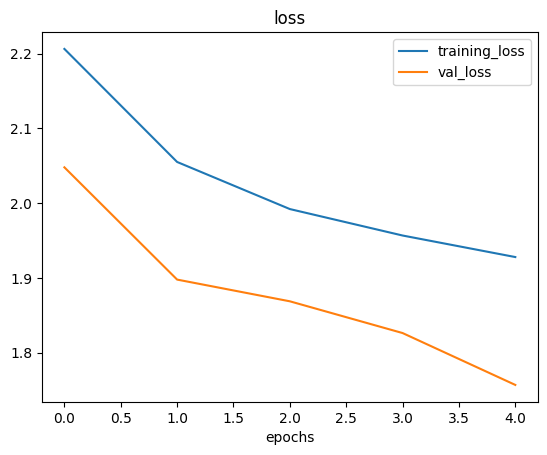

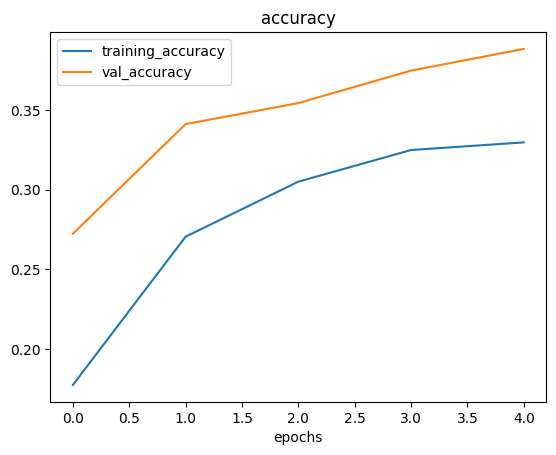

In [98]:
# Check out our model trained on augmented data's loss curves
plot_loss_curves(history_10)

Woah! that looks much better, the loss curves are much closer to each other than the baseline model and they look like they're heading in the right direnction (certainly not the wrong direction) so if we were to train for longer, we might see further improvements.

### 7. Repeat unitl satisfied

We could keep going here... continuously trying to bring our loss curves closer together and trying to improve the validation/testa accuracy.
How?
By running lost of experiments, namely:
* restructuring our model's architecture (increasing layers/hidden units)
* adjust the learning rate
* try different methods of data augmentation(adjust the hyperparameters in our ImageDataGenerator instance)
* training for longer(e.g. 10 epochs instead of 5 epochs)
* try **transfer learning**

Let's shuffle our augmented training data and train another model(the same as before) on it and see what happens.

In [112]:
# Create an augmented data generator instance
train_data_augmented = ImageDataGenerator(
  rescale = 1/255.,
  rotation_range=0.2,
  width_shift_range=0.2,
  height_shift_range=0.2,
  zoom_range=0.2,
  horizontal_flip=True,
)


train_data_augmented_shuffled = train_data_augmented.flow_from_directory(
  train_dir,
  target_size=(224, 224),
  batch_size = 32,
  class_mode="categorical",
  shuffle=True
) # shuffle data this time

Found 7500 images belonging to 10 classes.


In [114]:
# Let's create another model but this time we'll fit it on the augmented shuffle training data of 10 classes
model_11 = tf.keras.models.clone_model(model_8)

# Compile the cloned model (using the same setup as previous models)
model_11.compile(
  loss="categorical_crossentropy",
  optimizer = Adam(),
  metrics = ['accuracy'])

In [115]:
# Fit the model
history_11 = model_11.fit(
  train_data_augmented_shuffled,
  epochs=5,
  steps_per_epoch=len(train_data_augmented_shuffled),
  validation_data=test_data,
  validation_steps = len(test_data)
)

Epoch 1/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 108s 453ms/step - accuracy: 0.1632 - loss: 2.2424 - val_accuracy: 0.2944 - val_loss: 2.0112
Epoch 2/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 135s 429ms/step - accuracy: 0.2490 - loss: 2.0920 - val_accuracy: 0.3400 - val_loss: 1.8895
Epoch 3/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 138s 413ms/step - accuracy: 0.2988 - loss: 2.0050 - val_accuracy: 0.3752 - val_loss: 1.8196
Epoch 4/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 143s 418ms/step - accuracy: 0.3218 - loss: 1.9395 - val_accuracy: 0.3784 - val_loss: 1.7884
Epoch 5/5
235/235 ━━━━━━━━━━━━━━━━━━━━ 140s 409ms/step - accuracy: 0.3370 - loss: 1.9241 - val_accuracy: 0.3760 - val_loss: 1.8166


Looks like our model didn't perform well or it is similar to model_10, even changing shuffle = True

In [118]:
model_11.evaluate(test_data)

79/79 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3698 - loss: 1.7960


[1.8165693283081055, 0.37599998712539673]

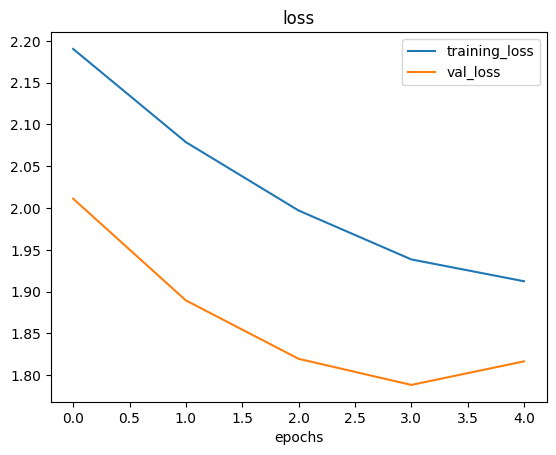

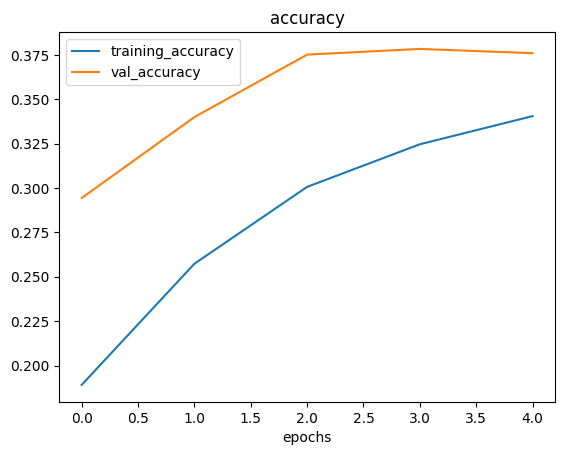

In [119]:
# Let's evaluate the loss curves of model_11
plot_loss_curves(history_11)

### Making a prediction with our trained model

Let's use our trained model to make some predictions on our own custom images!

In [106]:
# Remind ourselves of the classes our model is trained on
class_names

array(['chicken_curry', 'chicken_wings', 'fried_rice', 'grilled_salmon',
       'hamburger', 'ice_cream', 'pizza', 'ramen', 'steak', 'sushi'],
      dtype='<U14')

In [117]:
# Download some custom images
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/images/03-hamburger.jpeg

!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/images/03-pizza-dad.jpeg

!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/images/03-steak.jpeg

!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/images/03-sushi.jpeg

--2025-06-24 13:04:53--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/images/03-hamburger.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3564285 (3.4M) [image/jpeg]
Saving to: ‘03-hamburger.jpeg’

03-hamburger.jpeg   100%[===================>]   3.40M  --.-KB/s    in 0.06s   

2025-06-24 13:04:53 (58.6 MB/s) - ‘03-hamburger.jpeg’ saved [3564285/3564285]

--2025-06-24 13:04:53--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/images/03-pizza-dad.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP 

In [125]:
# Reconfig pred_and_plot function to work with multi-class images
def pred_and_plot(model, filename, class_names=class_names):
  """
  Imports an image located at filename, makes a prediction with model and plots the image with the predicted class as the title
  """
  # Import the target image and preprocess it
  img = load_and_prep_image(filename)

  # Make a prediction
  pred = model.predict(tf.expand_dims(img, axis=0))

  # Add in logic for mult_class & get pred_class name
  if len(pred[0]) > 1:
    pred_class = class_names[tf.argmax(pred[0])]
  else:
    pred_class = class_names[int(tf.round(pred[0]))]


  # Plot the image and predicted class
  plt.imshow(img)
  plt.title(f"Prediction: {pred_class}")
  plt.axis(False);

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


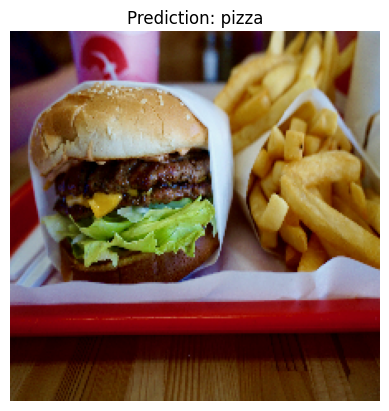

In [126]:
# make a prediction using model_10
pred_and_plot(
    model_10,
    filename="03-hamburger.jpeg",
    class_names=class_names
    )

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


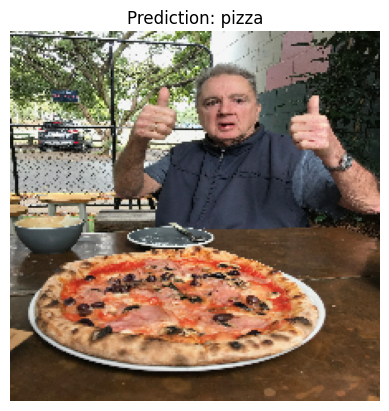

In [129]:
# make a prediction using model_10
pred_and_plot(
    model_10,
    filename="03-pizza-dad.jpeg",
    class_names=class_names
    )

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


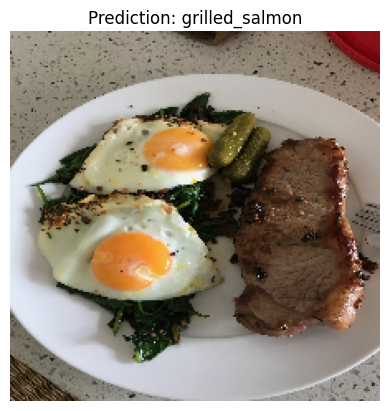

In [130]:
# make a prediction using model_10
pred_and_plot(
    model_10,
    filename="03-steak.jpeg",
    class_names=class_names
    )

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


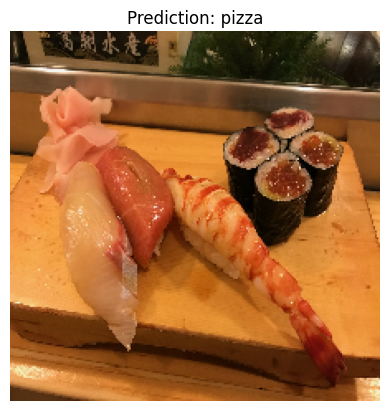

In [131]:
# make a prediction using model_10
pred_and_plot(
    model_10,
    filename="03-sushi.jpeg",
    class_names=class_names
    )

Looks like our model didn't perform very well on our custom images but this because it only achieved ~39% accuracy on the test data. So we can expect it to function quite poorly on other unseen data.